In [ ]:
import math
import os
import hashlib
from urllib.request import urlretrieve
import zipfile
import gzip
import shutil

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm import tqdm
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
def _read32(bytestream):
    """
    Read 32-bit integer from bytesteam
    :param bytestream: A bytestream
    :return: 32-bit integer
    """
    dt = np.dtype(np.uint32).newbyteorder('>')
    return np.frombuffer(bytestream.read(4), dtype=dt)[0]


def _unzip(save_path, _, data_path):

    print('Extracting {}...')
    with zipfile.ZipFile(save_path) as zf:
        zf.extractall(data_path)


def _ungzip(save_path, extract_path, _):

    # Get data from save_path
    with open(save_path, 'rb') as f:
        with gzip.GzipFile(fileobj=f) as bytestream:
            magic = _read32(bytestream)
            if magic != 2051:
                raise ValueError('Invalid magic number {} in file: {}'.format(magic, f.name))
            num_images = _read32(bytestream)
            rows = _read32(bytestream)
            cols = _read32(bytestream)
            buf = bytestream.read(rows * cols * num_images)
            data = np.frombuffer(buf, dtype=np.uint8)
            data = data.reshape(num_images, rows, cols)

    # Save data to extract_path
    for image_i, image in enumerate(
            tqdm(data, unit='File', unit_scale=True, miniters=1, desc='Extracting {}')):
        Image.fromarray(image, 'L').save(os.path.join(extract_path, 'image_{}.jpg'.format(image_i)))


def get_image(image_path, width, height, mode):

    image = Image.open(image_path)

    if image.size != (width, height):  
        # Remove most pixels that aren't part of a face
        face_width = face_height = 108
        j = (image.size[0] - face_width) // 2
        i = (image.size[1] - face_height) // 2
        image = image.crop([j, i, j + face_width, i + face_height])
        image = image.resize([width, height], Image.BILINEAR)

    return np.array(image.convert(mode))


def get_batch(image_files, width, height, mode):
    data_batch = np.array([get_image(sample_file, width, height, mode) for sample_file in image_files]).astype(np.float32)

    return data_batch


def images_square_grid(images, mode):

    # Get maximum size for square grid of images
    save_size = math.floor(np.sqrt(images.shape[0]))

    # Scale to 0-255
    images = (((images - images.min()) * 255) / (images.max() - images.min())).astype(np.uint8)

    # Put images in a square arrangement
    images_in_square = np.reshape(
            images[:save_size*save_size],
            (save_size, save_size, images.shape[1], images.shape[2], images.shape[3]))
    if mode == 'L':
        images_in_square = np.squeeze(images_in_square, 4)

    # Combine images to grid image
    new_im = Image.new(mode, (images.shape[1] * save_size, images.shape[2] * save_size))
    for col_i, col_images in enumerate(images_in_square):
        for image_i, image in enumerate(col_images):
            im = Image.fromarray(image, mode)
            new_im.paste(im, (col_i * images.shape[1], image_i * images.shape[2]))

    return new_im


def download_extract(data_path):

    url = 'https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip'
    hash_code = '00d2c5bc6d35e252742224ab0c1e8fcb'
    extract_path = os.path.join(data_path, 'img_align_celeba')
    save_path = os.path.join(data_path, 'celeba.zip')
    extract_fn = _unzip
        
    if os.path.exists(extract_path):
        print('Found CelebA data')
        return

    if not os.path.exists(data_path):
        os.makedirs(data_path)

    if not os.path.exists(save_path):
        with DLProgress(unit='B', unit_scale=True, miniters=1, desc='Downloading') as pbar:
            urlretrieve(
                url,
                save_path,
                pbar.hook)

    assert hashlib.md5(open(save_path, 'rb').read()).hexdigest() == hash_code, \
        '{} file is corrupted.  Remove the file and try again.'.format(save_path)

    os.makedirs(extract_path)
    try:
        extract_fn(save_path, extract_path, database_name, data_path)
    except Exception as err:
        shutil.rmtree(extract_path)  # Remove extraction folder if there is an error
        raise err

    # Remove compressed data
    os.remove(save_path)

class DLProgress(tqdm):
    """
    Handle Progress Bar while Downloading
    """
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

In [ ]:
data_dir = "/data"
download_extract(data_dir)

Found CelebA data


In [ ]:
from glob import glob

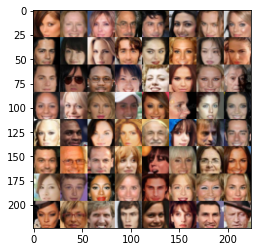

In [ ]:
show_n_images = 64
celeb_images = get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
plt.imshow(images_square_grid(celeb_images, 'RGB'))

In [ ]:
X_train = get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:], 32, 32, 'RGB')

In [ ]:
X_train.shape

(202599, 32, 32, 3)

In [ ]:
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

In [ ]:
z_dim = 200

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import LeakyReLU
from keras.layers import Flatten
from keras.layers import Reshape
from keras.layers import Conv2DTranspose
from keras.layers import BatchNormalization
from keras.layers import Activation
from keras.optimizers import Adam
from keras.utils.vis_utils import plot_model
from tqdm.notebook import tqdm

In [ ]:
from keras.layers import UpSampling2D

In [ ]:
noise_shape = (32, 32, 3,)
img_shape = (32, 32, 3)

In [ ]:
def Generator():
  model = Sequential()
  model.add(Conv2D(128, kernel_size=3, input_shape = noise_shape, padding="same"))
  model.add(Activation("relu"))
  model.add(BatchNormalization(momentum=0.8))
  model.add(UpSampling2D())

  model.add(Conv2D(64, kernel_size=3, padding="same"))
  model.add(Activation("relu"))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Flatten())
  model.add(Dense(256))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Dense(512))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Dense(1024))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Dense(np.prod(img_shape), activation='tanh'))
  model.add(Reshape(img_shape))

  return model

In [ ]:
g_model = Generator()
g_model.summary()

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 32, 32, 128)       3584      
_________________________________________________________________
activation_28 (Activation)   (None, 32, 32, 128)       0         
_________________________________________________________________
batch_normalization_39 (Batc (None, 32, 32, 128)       512       
_________________________________________________________________
up_sampling2d_8 (UpSampling2 (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 64, 64, 64)        73792     
_________________________________________________________________
activation_29 (Activation)   (None, 64, 64, 64)        0         
_________________________________________________________________
batch_normalization_40 (Batc (None, 64, 64, 64)      

In [ ]:
def Discriminator():
  model = Sequential()
  model.add(Conv2D(128, kernel_size=3, input_shape = img_shape, padding="same"))
  model.add(Activation("relu"))

  model.add(Conv2D(64, kernel_size=3, padding="same"))
  model.add(Activation("relu"))

  model.add(Flatten(input_shape=img_shape))

  model.add(Dense(512))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Dense(256))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Dense(1, activation='sigmoid'))
  opt = Adam(lr=0.0002, beta_1=0.5)
  model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ['accuracy'])
  return model

In [ ]:
d_model = Discriminator()
d_model.summary()

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 32, 32, 128)       3584      
_________________________________________________________________
activation_30 (Activation)   (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 32, 32, 64)        73792     
_________________________________________________________________
activation_31 (Activation)   (None, 32, 32, 64)        0         
_________________________________________________________________
flatten_14 (Flatten)         (None, 65536)             0         
_________________________________________________________________
dense_47 (Dense)             (None, 512)               33554944  
_________________________________________________________________
leaky_re_lu_34 (LeakyReLU)   (None, 512)             

In [ ]:
def Gan(g_model, d_model):
  d_model.trainable = False
  model = Sequential()
  model.add(g_model)
  model.add(d_model)
  opt = Adam(lr=0.0002, beta_1=0.5)
  model.compile(loss = 'binary_crossentropy', optimizer = opt)
  return model

In [ ]:
gan = Gan(g_model, d_model)
gan.summary()

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_19 (Sequential)   (None, 32, 32, 3)         70992960  
_________________________________________________________________
sequential_20 (Sequential)   (None, 1)                 33763905  
Total params: 104,756,865
Trainable params: 70,992,576
Non-trainable params: 33,764,289
_________________________________________________________________


In [ ]:
d_real = []
d_fake = []

In [ ]:
def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    for i in range(len(losses['D'])):
      d_real.append(losses['D'][i][0])

    for j in range(len(losses['D'])):
      d_fake.append(losses['D'][i][1])
    
    plt.figure(figsize=(10,8))
    plt.plot(d_real, label="Real Discriminator loss")
    plt.plot(d_fake, label = "Fake Discriminator Loss")
    plt.plot(losses['G'], label="Generator loss")

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

In [ ]:
def plot_generated(n_ex=10, dim=(1, 10), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, 32, 32, 3))
    generated_images = g_model.predict(noise)
    generated_images = (1/2.5) * generated_images + 0.5
    # generated_images = generated_images.reshape(generated_images.shape[0], 28, 28)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i, :, :])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
losses = {"D":[], "G":[]}
samples = []

In [ ]:
X_train.shape[0]

202599

In [ ]:
def train(epochs=1, frequency=1, BATCH_SIZE=128):
    batchesPerEpoch = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchesPerEpoch)
    
    for e in tqdm(range(1, epochs+1)):

        # Create a batch by drawing random index numbers from the training set
        image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
        image_batch = image_batch.reshape(image_batch.shape[0], image_batch.shape[1], image_batch.shape[2], 3)
        # Create noise vectors for the generator
        half_batch = int(BATCH_SIZE/2)
        noise = np.random.normal(0, 1, size=(BATCH_SIZE, 32, 32, 3))

        # Generate the images from the noise
        generated_images = g_model.predict(noise)
        samples.append(generated_images)
        X = np.concatenate((image_batch, generated_images))
        # Create labels
        y = np.zeros(2*BATCH_SIZE)
        y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

        # Train discriminator on generated images
        d_model.trainable = True
        d_loss = d_model.train_on_batch(X, y)

        # Train generator
        noise = np.random.normal(0, 1, size=(BATCH_SIZE, 32, 32, 3))
        y2 = np.ones(BATCH_SIZE)
        d_model.trainable = False
        g_loss = gan.train_on_batch(noise, y2)

        losses["D"].append(d_loss)
        losses["G"].append(g_loss)

        # Update the plots
        if e == 1 or e%frequency == 0:
            plot_generated()
            plot_loss(losses)
    # plot_loss(losses)

Epochs: 30000
Batch size: 128
Batches per epoch: 1582


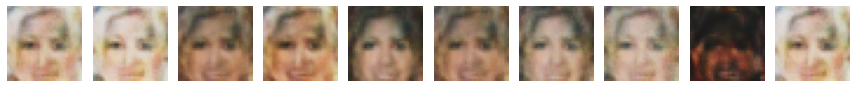

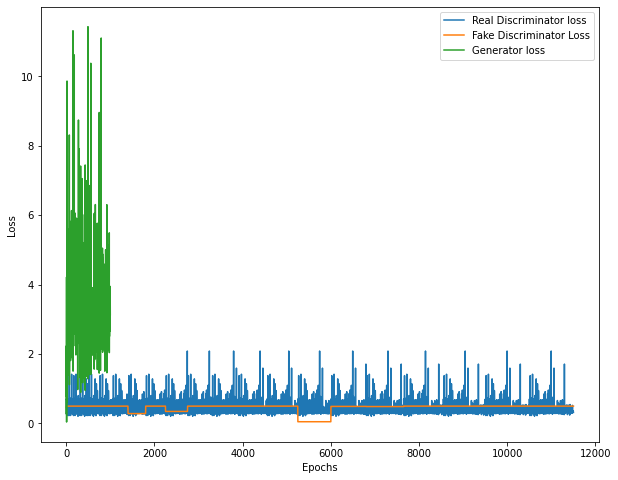

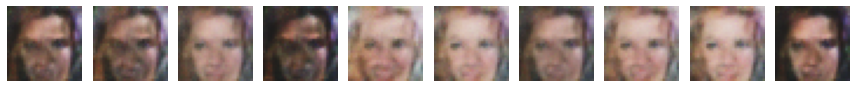

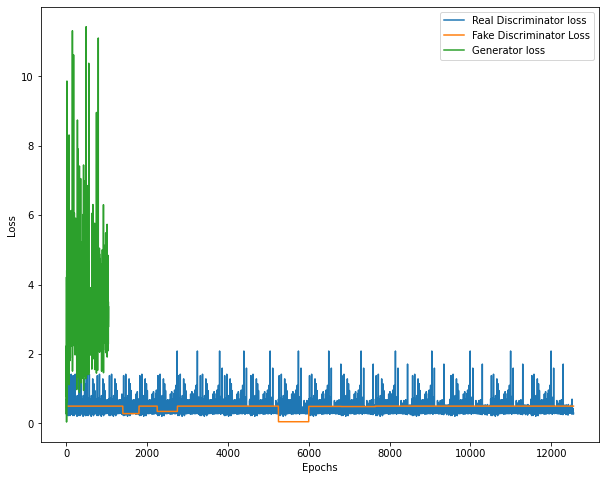

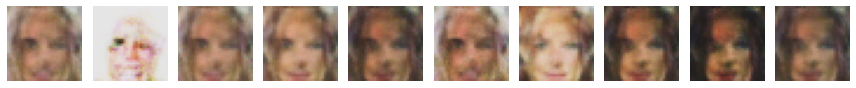

...

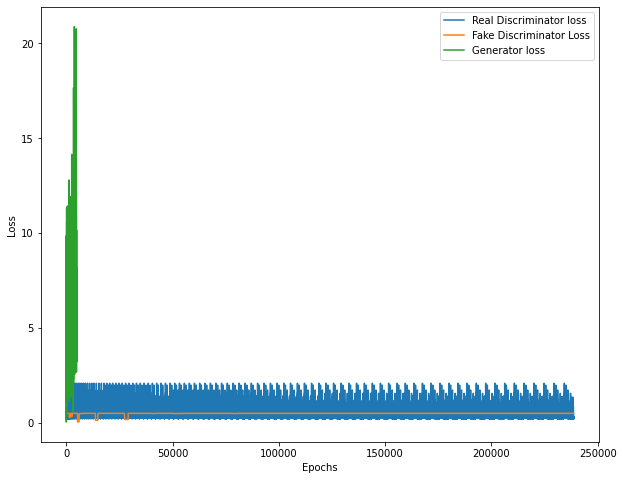

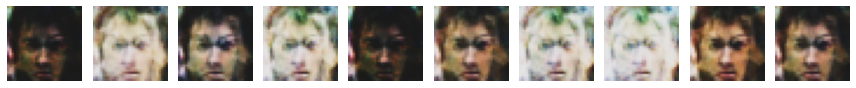

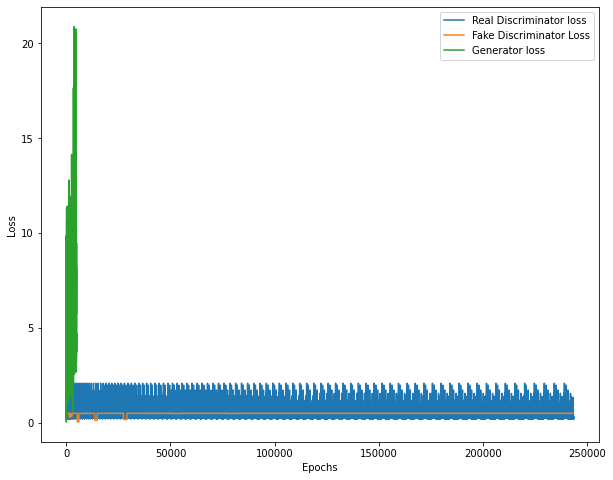

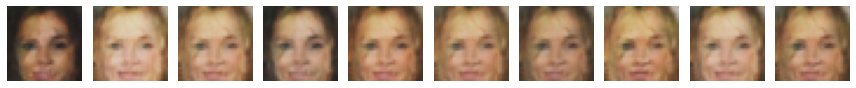

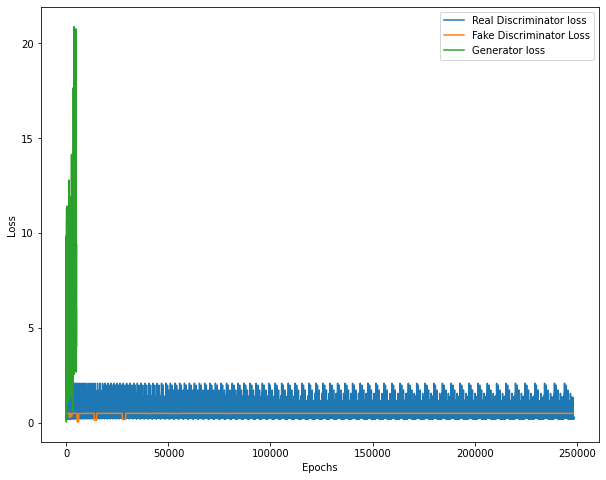

In [ ]:
train(epochs = 30000, frequency=50, BATCH_SIZE=128)